In [1]:
import os
import easyocr
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

In [2]:
reader = easyocr.Reader(['ch_sim','en']) # this needs to run only once to load the model into memory

In [3]:
input_path = 'data/processed/'
output_path = 'data/easy_ocr_preprocessed/'
input_images_name = sorted(os.listdir(input_path))
print(input_images_name)

['IMG_0834.JPG', 'IMG_0835.JPG', 'IMG_0836.JPG', 'IMG_0837.JPG', 'IMG_0838.JPG', 'IMG_0839.JPG', 'IMG_0840.JPG', 'IMG_0841.JPG', 'IMG_0842.JPG', 'IMG_0843.JPG', 'IMG_0844.JPG', 'IMG_0845.JPG', 'IMG_0846.JPG', 'IMG_0847.JPG', 'IMG_0848.JPG', 'IMG_0849.JPG', 'IMG_0850.JPG', 'IMG_0851.JPG', 'IMG_0852.JPG', 'IMG_0853.JPG', 'IMG_0854.JPG', 'IMG_0855.JPG', 'IMG_0856.JPG', 'IMG_0857.JPG', 'IMG_0858.JPG', 'IMG_0859.JPG', 'IMG_0860.JPG', 'IMG_0861.JPG', 'IMG_0862.JPG', 'IMG_0863.JPG', 'IMG_0864.JPG', 'IMG_0865.JPG', 'IMG_0866.JPG', 'IMG_0867.JPG', 'IMG_0868.JPG']


In [4]:
# Draw bounding boxes and text
def draw_image(path, bounds, color='red', width=2):
    myFont = ImageFont.truetype('data/font/msyh.ttc', 32)
    image = Image.open(path)
    image = image.rotate(90, expand=True) # uncomment this line if necessary
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        p0, p1, p2, p3 = bound[0]
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=color, width=width)
        draw.text(p3, bound[1], font=myFont, fill=(255, 0, 0))
    return image
    

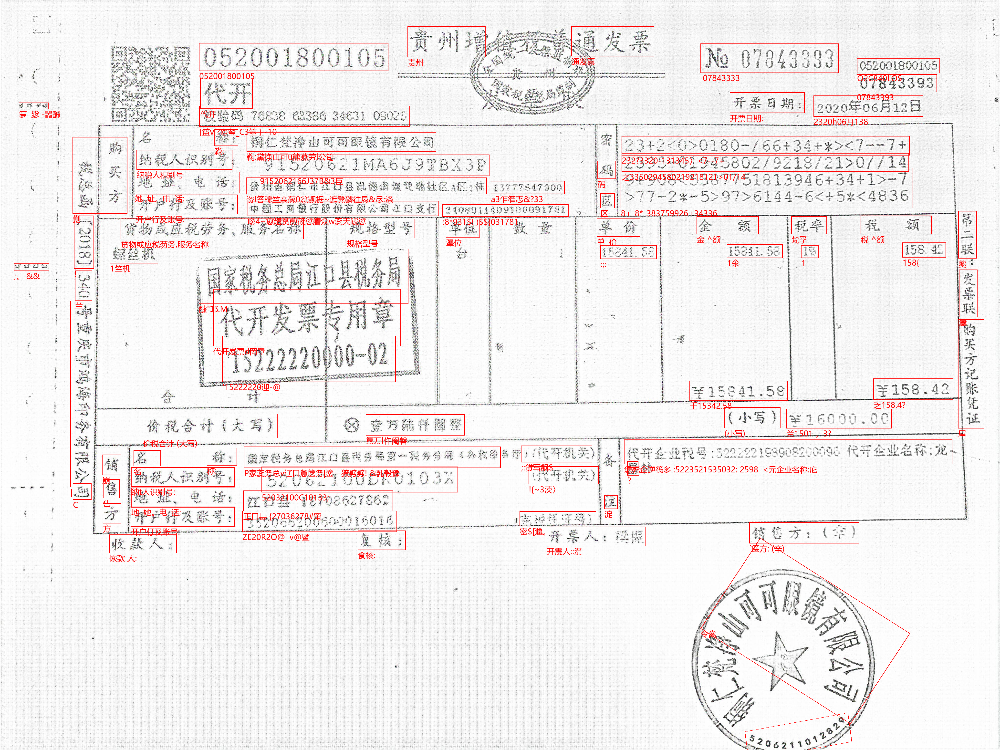

data/processed/IMG_0850.JPG


In [5]:
for img_name in input_images_name[16:17]:
    path = input_path + img_name
    result = reader.readtext(path)
    display(draw_image(path, result))
    print(path)